In [1]:
import wandb

from ax.service.ax_client import AxClient, ObjectiveProperties
from ax.service.utils.report_utils import exp_to_df

# Plotting imports and initialization
from ax.utils.notebook.plotting import render, init_notebook_plotting
from ax.plot.pareto_utils import compute_posterior_pareto_frontier
from ax.plot.pareto_frontier import plot_pareto_frontier
from ax.plot.pareto_frontier import scatter_plot_with_pareto_frontier_plotly
from ax.service.utils.report_utils import _pareto_frontier_scatter_2d_plotly
from ax.plot.contour import interact_contour_plotly
from ax.plot.feature_importances import plot_feature_importance_by_feature_plotly
from ax.modelbridge.factory import get_MOO_NEHVI 
import torch
from evaluate import scalar_mappable, get_contour_plots
from util import init_wandb
from plot import plot_marginal_effects
init_notebook_plotting()

%load_ext autoreload
%autoreload 2

[INFO 07-13 16:32:02] ax.utils.notebook.plotting: Injecting Plotly library into cell. Do not overwrite or delete cell.


In [4]:
# resume wandb run
wandb.init(
    project="scaling-laws-nas_high_level", 
    entity="ga92xug", 
    resume="allow",
    id="mrb9zin0",  # resume the run using the saved run ID
)
step=70

Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.


wandb: Currently logged in as: ga92xug. Use `wandb login --relogin` to force relogin


In [3]:
ax_client = AxClient.load_from_json_file(filepath="data/mnist_rot_without_group_0/ax_client.json")

experiment = ax_client.experiment
data = experiment.fetch_data()
device = torch.device('cuda' if torch.cuda.is_available() else "cpu")
model = get_MOO_NEHVI(
    experiment=experiment, 
    data=data,
    device=device
)

/home/frischs/anaconda3/envs/scaling-test/lib/python3.11/site-packages/ax/core/parameter.py:511: UserWarning:

`sort_values` is not specified for `ChoiceParameter` "1_conv_op". Defaulting to `False` for parameters of `ParameterType` STRING. To override this behavior (or avoid this warning), specify `sort_values` during `ChoiceParameter` construction.

/home/frischs/anaconda3/envs/scaling-test/lib/python3.11/site-packages/ax/core/parameter.py:511: UserWarning:

`sort_values` is not specified for `ChoiceParameter` "1_skip_op". Defaulting to `False` for parameters of `ParameterType` STRING. To override this behavior (or avoid this warning), specify `sort_values` during `ChoiceParameter` construction.

/home/frischs/anaconda3/envs/scaling-test/lib/python3.11/site-packages/ax/core/parameter.py:511: UserWarning:

`sort_values` is not specified for `ChoiceParameter` "2_conv_op". Defaulting to `False` for parameters of `ParameterType` STRING. To override this behavior (or avoid this warning), 

In [ ]:
pareto_frontier = _pareto_frontier_scatter_2d_plotly(experiment)
pareto_frontier
wandb.log({"pareto_frontier": wandb.Plotly(pareto_frontier)}, step=step, commit=True)
step += 1

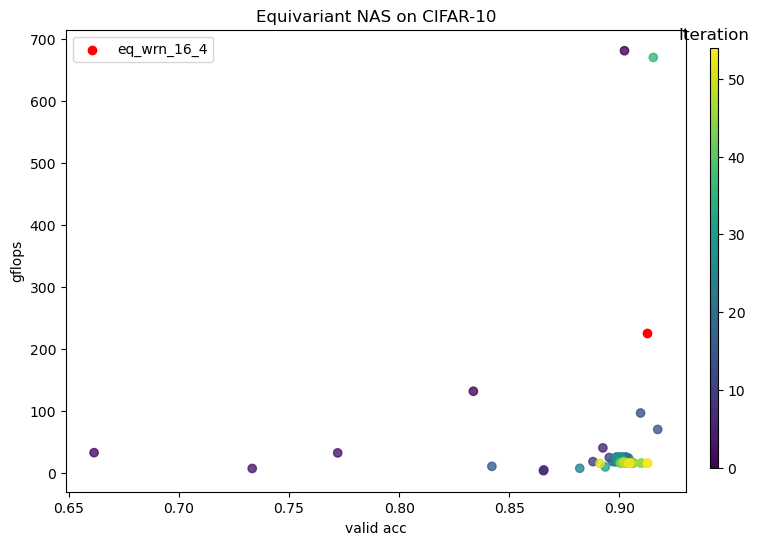

In [ ]:
fig = scalar_mappable(ax_client.experiment)
fig.show()
wandb.log({"pareto_frontier_image": wandb.Image(fig)}, step=step, commit=True)
step += 1

In [35]:
valid_acc_contour_plot, gflops_contour_plot = get_contour_plots(
        model=model,
    )
wandb.log({"valid_acc_contour": wandb.Plotly(valid_acc_contour_plot)}, step=step, commit=True)
step += 1
wandb.log({"gflops_contour": wandb.Plotly(gflops_contour_plot)}, step=step, commit=True)
step += 1

[ERROR 07-05 17:21:37] ax.plot.helper: Have observations of arms with different features but same name. Arbitrary one will be plotted.


[ERROR 07-05 17:21:38] ax.plot.helper: Have observations of arms with different features but same name. Arbitrary one will be plotted.
[ERROR 07-05 17:21:38] ax.plot.helper: Have observations of arms with different features but same name. Arbitrary one will be plotted.
[ERROR 07-05 17:21:39] ax.plot.helper: Have observations of arms with different features but same name. Arbitrary one will be plotted.
[ERROR 07-05 17:21:40] ax.plot.helper: Have observations of arms with different features but same name. Arbitrary one will be plotted.
[ERROR 07-05 17:21:40] ax.plot.helper: Have observations of arms with different features but same name. Arbitrary one will be plotted.
[ERROR 07-05 17:21:41] ax.plot.helper: Have observations of arms with different features but same name. Arbitrary one will be plotted.
[ERROR 07-05 17:21:42] ax.plot.helper: Have observations of arms with different features but same name. Arbitrary one will be plotted.
[ERROR 07-05 17:21:42] ax.plot.helper: Have observation

In [36]:
valid_acc_contour_plot

In [37]:
feature_importance = plot_feature_importance_by_feature_plotly(model)
wandb.log({"feature_importance": wandb.Plotly(feature_importance)}, step=step, commit=True)
step += 1

In [ ]:
figures = plot_marginal_effects(model, "valid_acc")
figures[1]
# for idx, fig in enumerate(figures):
#     wandb.log({f"{idx}_marginal_effects": wandb.Plotly(fig)}, step=step, commit=True)
#     step += 1

[ERROR 07-05 17:36:26] ax.plot.helper: Have observations of arms with different features but same name. Arbitrary one will be plotted.


/home/frischs/scaling-laws-ecnn/NAS/plot.py:605: FutureWarning:

In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.



In [39]:
wandb.finish()

In [ ]:
import numpy as np

# Given array
given_array = np.array([1, 2, 4, 8, 16])

# Desired density (number of points between each pair of values)
density = 2 * len(given_array) + 1

# Generate the output with evenly spaced values
output = np.interp(np.linspace(0, len(given_array) - 1, density), np.arange(len(given_array)), given_array)
print(output)

In [41]:
df = exp_to_df(ax_client.experiment).sort_values(by=["trial_index"])
outcomes = df[["valid_acc", "gflops"]].values
df.sort_values(by=["valid_acc"], ascending=False)

,trial_index,arm_name,trial_status,generation_method,gflops,model_building_time,valid_acc,is_feasible,0_reflection,0_group,...,3_kernel_size,3_se_ratio,3_out_channels,4_reflection,4_group,4_out_channels,4_kernel_size,1_skip_op,2_skip_op,3_skip_op
15,15,15_0,COMPLETED,FullyBayesianMOO,69.831630,0.233595,0.9174,True,-1,1,...,1,0,4,-1,0,4,0,identity,identity,identity
36,36,36_0,COMPLETED,FullyBayesianMOO,669.489103,233.763093,0.9154,False,0,4,...,1,1,4,0,1,0,0,identity,conv,conv
54,54,52_0,COMPLETED,FullyBayesianMOO,15.565495,0.195315,0.9129,True,0,1,...,1,0,4,-1,0,0,0,identity,identity,identity
52,52,52_0,COMPLETED,FullyBayesianMOO,15.565495,0.194477,0.9126,True,0,1,...,1,0,4,-1,0,0,0,identity,identity,identity
38,38,38_0,COMPLETED,FullyBayesianMOO,15.565495,0.195296,0.9099,True,0,1,...,1,0,4,-1,0,0,0,identity,identity,identity
47,47,38_0,COMPLETED,FullyBayesianMOO,15.565495,0.195356,0.9097,True,0,1,...,1,0,4,-1,0,0,0,identity,identity,identity
13,13,13_0,COMPLETED,FullyBayesianMOO,96.340686,0.238220,0.9096,True,0,1,...,1,0,4,-1,0,4,0,identity,identity,identity
44,44,44_0,COMPLETED,FullyBayesianMOO,15.565495,0.194804,0.9064,True,0,1,...,1,0,4,-1,0,0,0,identity,identity,identity
32,32,32_0,COMPLETED,FullyBayesianMOO,17.119481,0.192124,0.9058,True,-1,1,...,1,0,4,-1,0,0,0,identity,identity,identity
40,40,38_0,COMPLETED,FullyBayesianMOO,15.565495,0.194039,0.9057,True,0,1,...,1,0,4,-1,0,0,0,identity,identity,identity


In [49]:
df[["0_group", "1_group"]].value_counts()

0_group  1_group
1        0          44
5        5           4
         4           2
2        2           1
3        2           1
4        3           1
         4           1
5        0           1
dtype: int64